In [2]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from nilearn import image, plotting
from nilearn.maskers import NiftiMapsMasker, NiftiLabelsMasker
from nilearn.connectome import ConnectivityMeasure
from nilearn import datasets
from nilearn.signal import clean
from nilearn.interfaces.fmriprep import load_confounds
from itertools import groupby

from pathlib import Path
# Set this to path of where dataset is stored




In [ ]:
dataset_root = Path("/Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/")

## Set a writable directory for the cache
writable_cache = '/tmp/nilearn_cache'

if not os.path.exists(writable_cache):
    os.makedirs(writable_cache)

### Shaefer Atals
atlas_dataset = datasets.fetch_atlas_schaefer_2018(data_dir=dataset_root, n_rois=400, yeo_networks=7)
atlas_filepath = atlas_dataset.maps
atlas_labels = atlas_dataset.labels[1:]

atlas_masker = NiftiLabelsMasker(
    labels_img=atlas_dataset.maps,
    standardize=True, # Z-scores the time series
    detrend=True,
    #high_pass=0.009, low_pass=0.08, t_r=2.1 # Adjust TR to your data
)

atlas_masker.fit()

network_assignments = [label.decode('utf-8').split('_')[2] if isinstance(label, bytes) else label.split('_')[2] for label in atlas_labels]
sort_idx = np.argsort(network_assignments)

correlation_measure = ConnectivityMeasure(kind='correlation', standardize='zscore_sample',)

def compute_connectivity(func_file):

    fmri_img = image.load_img(func_file)
    timeseries = atlas_masker.transform(fmri_img)
    matrix = correlation_measure.fit_transform([timeseries])[0]
    
    # 3. Calculate the global signal
    global_signal = np.mean(timeseries, axis=1)

    # 4. Regress out the global signal
    # We pass global_signal as a confound (needs to be 2D: shape = (n_timepoints, 1))
    cleaned_time_series = clean(timeseries,
                                confounds=global_signal.reshape(-1, 1),
                                detrend=True,
                                standardize="zscore_sample")

    # 5. Optional: Project back to 4D Nifti image
    cleaned_img = atlas_masker.inverse_transform(cleaned_time_series)

    #cleaned_img = fmri_img
    data_in_atlas_wake = atlas_masker.fit_transform(cleaned_img)

    
    correlation_matrix = correlation_measure.fit_transform([data_in_atlas_wake])[0]

    return correlation_matrix

def plot_connectivity_matrix(matrix, labels, title="Connectivity Matrix"):
    fig, ax = plt.subplots(figsize=(12, 10))
    im = ax.imshow(matrix, vmin=-1, vmax=1, cmap="RdBu_r")
    ax.set_xticks(range(len(labels)))
    ax.set_yticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=90, fontsize=7)
    ax.set_yticklabels(labels, fontsize=7)
    plt.colorbar(im, ax=ax, label="Pearson r")
    ax.set_title(title)
    plt.tight_layout()
    #plt.show()

def plot_networks(matrix, ax, vmin=-0.8, vmax=0.8, cmap="RdBu_r"):

    ordered_matrix = matrix[sort_idx, :][:, sort_idx]
    ordered_labels = [network_assignments[i] for i in sort_idx]

    #count and summarize labels for axis purposes
    unique_networks = []
    network_sizes = []
    for k, g in groupby(ordered_labels):
        unique_networks.append(k)
        network_sizes.append(sum(1 for _ in list(g)))

    #establish label boundaries 
    boundaries = np.insert(np.cumsum(network_sizes), 0, 0)
    tick_positions = [(boundaries[i] + boundaries[i+1]) / 2 for i in range(len(boundaries) - 1)]

    #plot matrix
    display = plotting.plot_matrix(
        ordered_matrix,
        colorbar=True,
        reorder=False,
        axes=ax,
        vmin=vmin, vmax=vmax,
        cmap=cmap,

    )

    # boundary lines inside axis
    colors = plt.cm.Set2(np.linspace(0, 1, len(network_sizes)))
    for i in range(1, len(boundaries) - 1):
        ax.axvline(boundaries[i] - 0.5, color="black", linewidth=0.5, alpha=0.9)
        ax.axhline(boundaries[i] - 0.5, color="black", linewidth=0.5, alpha=0.9)
        
    bar_width = 15 
    matrix_size = ordered_matrix.shape[0]

    # colored bars along the edges
    for i in range(len(boundaries) - 1):
        start, end = boundaries[i], boundaries[i+1]
        current_color = colors[i]
        
        # Left edge color bar (Y-axis tracking)
        ax.axhspan(start - 0.5, end - 0.5, xmin=-bar_width/matrix_size, xmax=0, 
                color=current_color, clip_on=False, zorder=3)
        
        # Bottom edge color bar (X-axis tracking)
        ax.axvspan(start - 0.5, end - 0.5, ymin=-bar_width/matrix_size, ymax=0, 
                color=current_color, clip_on=False, zorder=3)

    ax.tick_params(axis='both', which='both', length=18, pad=10, direction='out')

    # labels 
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(unique_networks, rotation=90, fontsize=10)

    ax.set_yticks(tick_positions)
    ax.set_yticklabels(unique_networks, fontsize=10)




[fetch_atlas_schaefer_2018] Dataset found in 
/Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/schaefer_2018

Found subject: sub-01
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-01/sub-01_task-rest_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:31: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  timeseries = atlas_masker.transform(fmri_img)
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:31: UserWarning: Resampling labels at transform time...
To avoid this warning, make sure to pass the images you want to transform to fit() first, or directly use fit_transform().
  timeseries = atlas_masker.transform(fmri_img)
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate s

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-01/sub-01_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-02
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-02/sub-02_task-rest_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Sleep file not found for sub-02, skipping sleep condition.
Found subject: sub-03
Wake file not found for sub-03, skipping wake condition.
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-03/sub-03_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-04
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-04/sub-04_task-sleep_run-5_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-04/sub-04_task-sleep_run-3_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-05
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-05/sub-05_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Sleep file not found for sub-05, skipping sleep condition.
Found subject: sub-06
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-06/sub-06_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-06/sub-06_task-rest_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-07
Wake file not found for sub-07, skipping wake condition.
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-07/sub-07_task-sleep_run-3_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-08
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-08/sub-08_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Sleep file not found for sub-08, skipping sleep condition.
Found subject: sub-09
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-09/sub-09_task-sleep_run-1_processed.nii.gz
Wake file not found for sub-09, skipping wake condition.
Sleep file not found for sub-09, skipping sleep condition.
Found subject: sub-10
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-10/sub-10_task-sleep_run-6_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-10/sub-10_task-sleep_run-4_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-11
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-11/sub-11_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-11/sub-11_task-sleep_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-12
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-12/sub-12_task-sleep_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-12/sub-12_task-sleep_run-3_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-13
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-13/sub-13_task-sleep_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-13/sub-13_task-rest_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-14
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-14/sub-14_task-rest_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-14/sub-14_task-sleep_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-15
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-15/sub-15_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-15/sub-15_task-sleep_run-4_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-16
Wake file not found for sub-16, skipping wake condition.
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-16/sub-16_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-18
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-18/sub-18_task-sleep_run-4_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-18/sub-18_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-19
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-19/sub-19_task-rest_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-19/sub-19_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-20
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-20/sub-20_task-sleep_run-4_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-20/sub-20_task-sleep_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-21
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-21/sub-21_task-rest_run-2_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-21/sub-21_task-rest_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-22
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-22/sub-22_task-sleep_run-8_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-22/sub-22_task-sleep_run-3_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-23
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-23/sub-23_task-sleep_run-6_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-23/sub-23_task-sleep_run-4_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-24
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-24/sub-24_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-24/sub-24_task-sleep_run-4_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-25
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-25/sub-25_task-sleep_run-6_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-25/sub-25_task-sleep_run-3_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-26
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-26/sub-26_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Sleep file not found for sub-26, skipping sleep condition.
Found subject: sub-27
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-27/sub-27_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-27/sub-27_task-sleep_run-3_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-28
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-28/sub-28_task-sleep_run-1_processed.nii.gz
Wake file not found for sub-28, skipping wake condition.
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-28/sub-28_task-sleep_run-4_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-29
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-29/sub-29_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-29/sub-29_task-rest_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-30
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-30/sub-30_task-sleep_run-5_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-30/sub-30_task-sleep_run-6_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-31
Wake file not found for sub-31, skipping wake condition.
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-31/sub-31_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-32
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-32/sub-32_task-sleep_run-4_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-32/sub-32_task-sleep_run-3_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Found subject: sub-33
Using: /Users/graceburns/Desktop/brainhack/ds003768-download/sourcedata/fMRI_processed_file_1/sub-33/sub-33_task-sleep_run-1_processed.nii.gz


/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:32: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrix = correlation_measure.fit_transform([timeseries])[0]
/var/folders/8g/p7ff70d95_bdwg0q9xjdcddc0000gn/T/ipykernel_65458/1792379600.py:48: FutureWarning: The 'zscore' strategy incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the 'zscore' option will be removed and using standardize=True will fall back to 'zscore_sample'.To avoid this warnin

Sleep file not found for sub-33, skipping sleep condition.


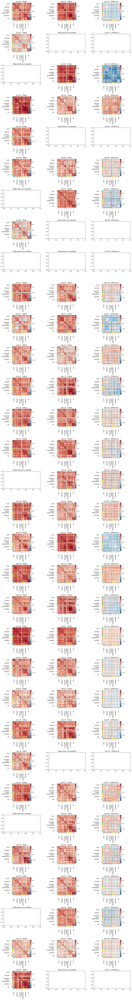

In [6]:
correlation_measure = ConnectivityMeasure(kind="correlation")

subjects = sorted(dataset_root.glob("sub-*"))

wake_files = pd.read_csv("../run_classification_files/wake_stage_identification.csv", delimiter=",", index_col='subject')
sleep_files = pd.read_csv("../run_classification_files/sleep_stage_identification.csv", delimiter=",", index_col='subject')
fig, axes = plt.subplots(32, 3, figsize=(15, 110), layout="tight")
i = 0

wake_matrices = []
sleep_matrices = []

for subject in subjects:
    axes[i, 0].set_title(f"{subject.name} - Wake")
    axes[i, 1].set_title(f"{subject.name} - Sleep")
    axes[i, 2].set_title(f"{subject.name} - Difference")
    print("Found subject:", subject.name)
    
    try:

        selected_file = wake_files['session'].loc[subject.name]
        func_file_wake = dataset_root / f"{subject.name}/{subject.name}_{selected_file}_processed.nii.gz"
        print("Using:", func_file_wake)

        correlation_matrix_wake = compute_connectivity(func_file_wake)
        plot_networks(correlation_matrix_wake, axes[i, 0])

        wake_matrices.append(correlation_matrix_wake)
        
    except (KeyError, ValueError):
        print(f"Wake file not found for {subject.name}, skipping wake condition.")
        axes[i, 0].set_title("Wake data not available")
    
    try: 
        selected_file = sleep_files['session'].loc[subject.name]
        func_file_sleep = dataset_root / f"{subject.name}/{subject.name}_{selected_file}_processed.nii.gz"
        print("Using:", func_file_sleep)

        correlation_matrix_sleep = compute_connectivity(func_file_sleep)
        plot_networks(correlation_matrix_sleep, axes[i, 1])
        
        sleep_matrices.append(correlation_matrix_sleep)
        correlation_matrix_diff = correlation_matrix_wake - correlation_matrix_sleep
        plot_networks(correlation_matrix_diff, axes[i, 2])
        
    except (KeyError,ValueError):
        print(f"Sleep file not found for {subject.name}, skipping sleep condition.")
        axes[i, 1].set_title("Sleep data not available")
    i += 1
 


plt.show()

In [7]:
fig.savefig("connectivity_matrices_as_given.pdf", dpi=300)

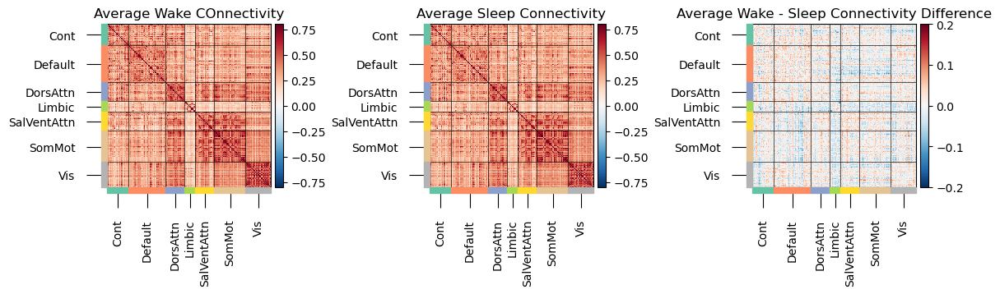

<Figure size 640x480 with 0 Axes>

In [9]:
average_wake_matrix = np.mean(wake_matrices, axis=0)
average_sleep_matrix = np.mean(sleep_matrices, axis=0)
average_diff_matrix = average_wake_matrix - average_sleep_matrix

fig, ax = plt.subplots(1,3, figsize=(12, 10), layout="tight")
plot_networks(average_wake_matrix, ax[0])
plot_networks(average_sleep_matrix, ax[1])
plot_networks(average_diff_matrix, ax[2], vmin=-0.2, vmax=0.2,)
ax[0].set_title("Average Wake COnnectivity")
ax[1].set_title("Average Sleep Connectivity")
ax[2].set_title("Average Wake - Sleep Connectivity Difference")

plt.show()
plt.savefig("average_connectivity_difference_as_given.pdf", dpi=300)


In [ ]:

np.save("wake_matrices.npy", np.array(wake_matrices))
np.save("sleep_matrices.npy", np.array(sleep_matrices))

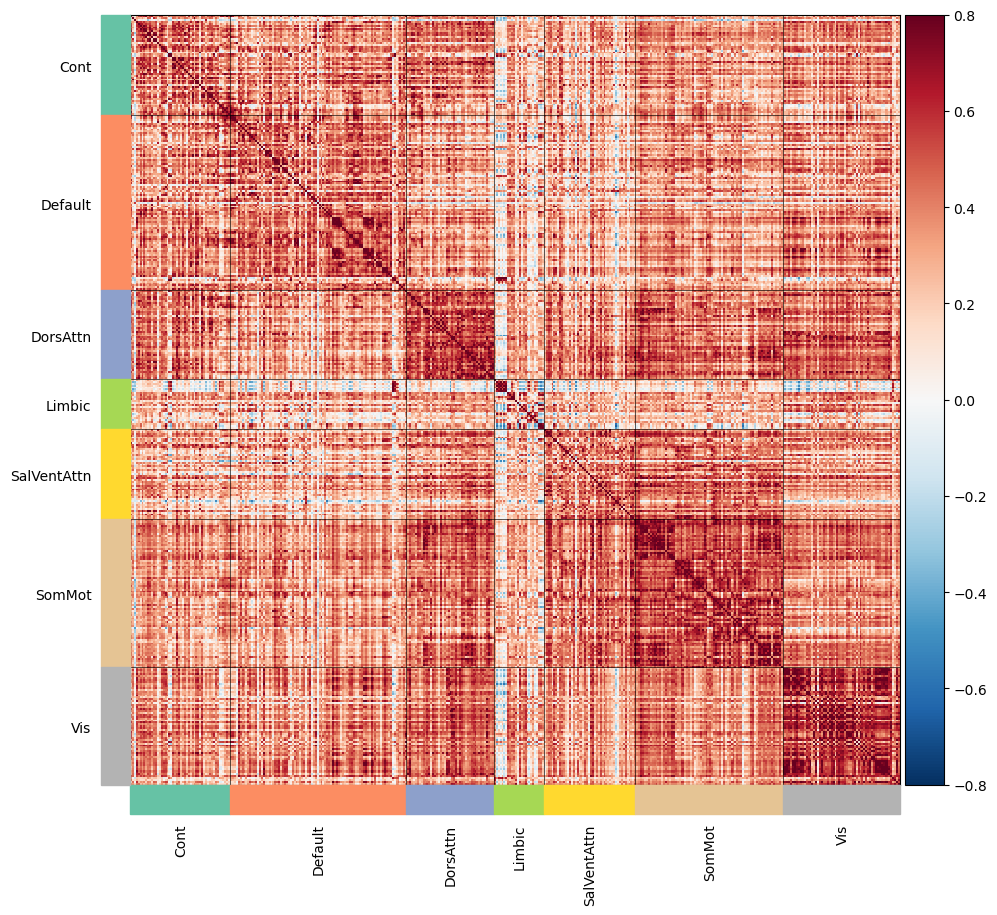

In [ ]:
wake_array =np.load("wake_matrices.npy")
fig, ax = plt.subplots(figsize=(12, 10))
plot_networks(wake_array[0], ax)
fig.savefig("wake_matrix_example.pdf", dpi=300)